In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# Then move kaggle.json into the folder where the API expects to find it.
! mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

mv: cannot stat 'kaggle.json': No such file or directory


## house prices competition 참여 링크
### https://www.kaggle.com/c/house-prices-advanced-regression-techniques

* 간략한 데이터 목표 설명
    - 아이오와주 에임스에 있는 주거용 주택의 거의 모든 측면을 설명하는 79개의 설명변수를 기반으로 '주택의 최종 가격'을 예측하는 것![링크 텍스트](https://)

In [ ]:
# Get House Prices
!kaggle competitions download -c house-prices-advanced-regression-techniques

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python2.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python2.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 146, in authenticate
    self.config_file, self.config_dir))
IOError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [ ]:
!ls -lah

total 16K
drwxr-xr-x 1 root root 4.0K Jul 16 13:20 .
drwxr-xr-x 1 root root 4.0K Jul 29 14:53 ..
drwxr-xr-x 4 root root 4.0K Jul 16 13:19 .config
drwxr-xr-x 1 root root 4.0K Jul 16 13:20 sample_data


In [ ]:
!pip install sweetviz

     |████████████████████████████████| 15.1 MB 170 kB/s 
     |████████████████████████████████| 76 kB 4.2 MB/s 
  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.41.1
    Uninstalling tqdm-4.41.1:
      Successfully uninstalled tqdm-4.41.1


In [ ]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import sklearn.metrics as metrics
import math
import sweetviz as sv
import missingno as msno

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/ML_class/kaggle_house

/content/drive/MyDrive/ML_class/kaggle_house


In [ ]:
drive

sample_submission = pd.read_csv("sample_submission.csv")
test = pd.read_csv("test.csv")
train = pd.read_csv("train.csv")
#Creating a copy of the train and test datasets
c_test  = test.copy()
c_train  = train.copy()

                                             |          | [  0%]   00:00 -> (? left)


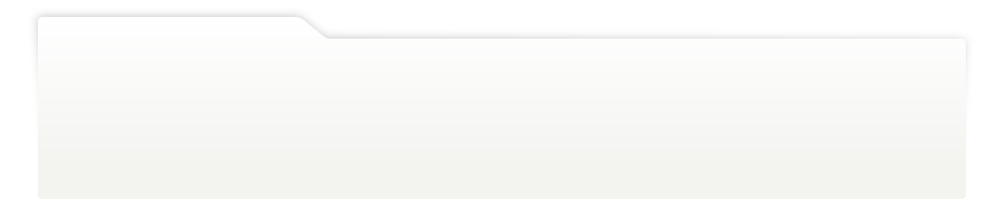
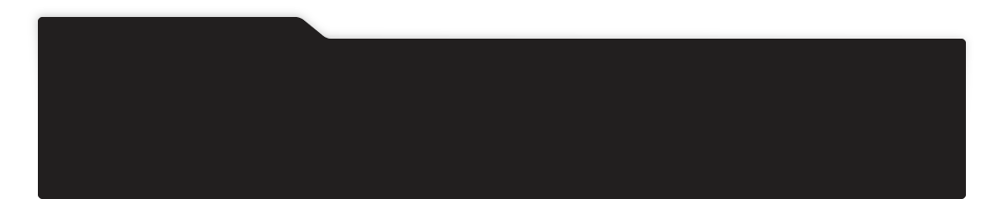
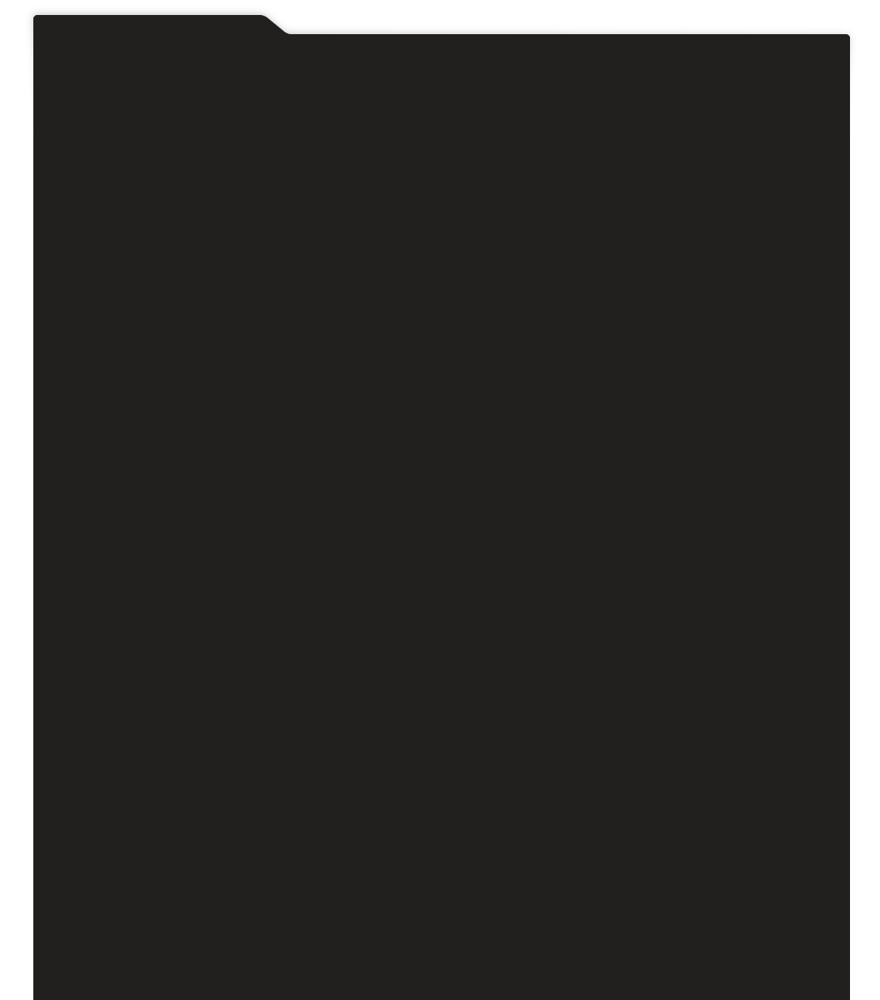
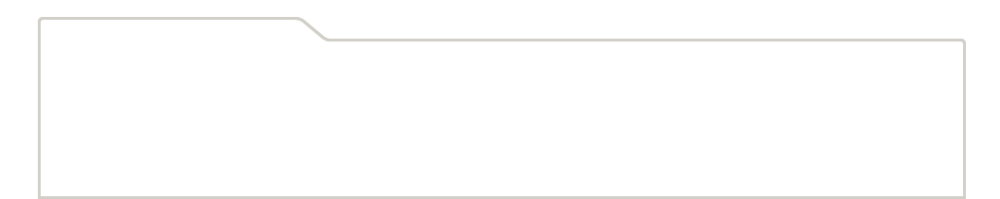
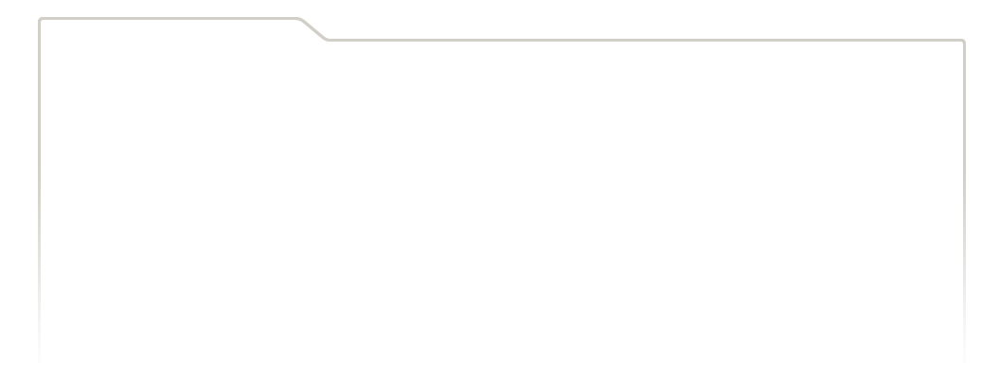
...
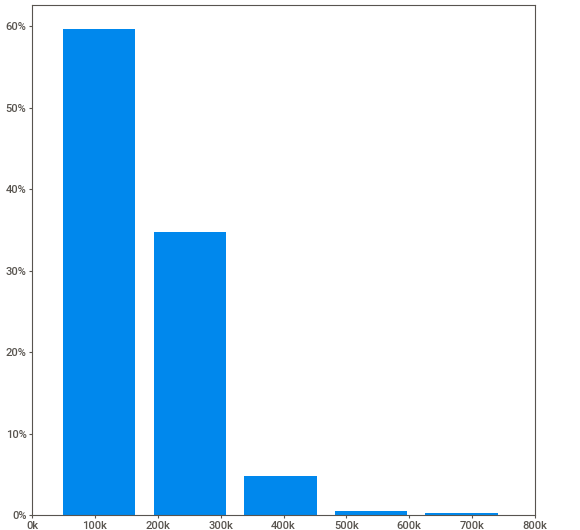
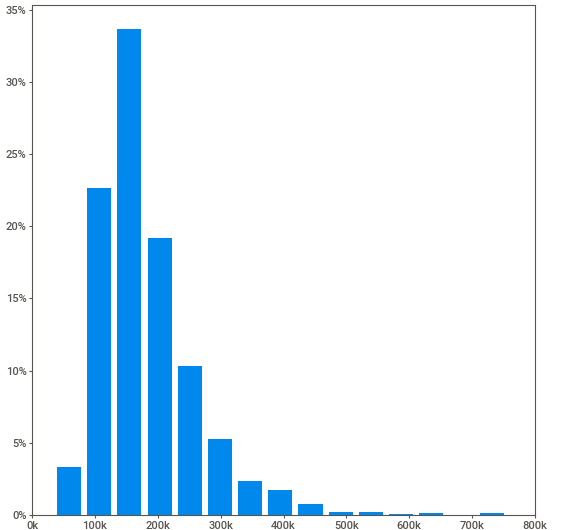
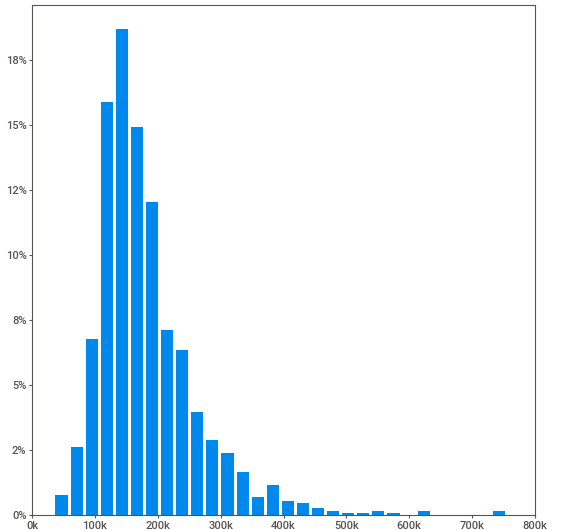
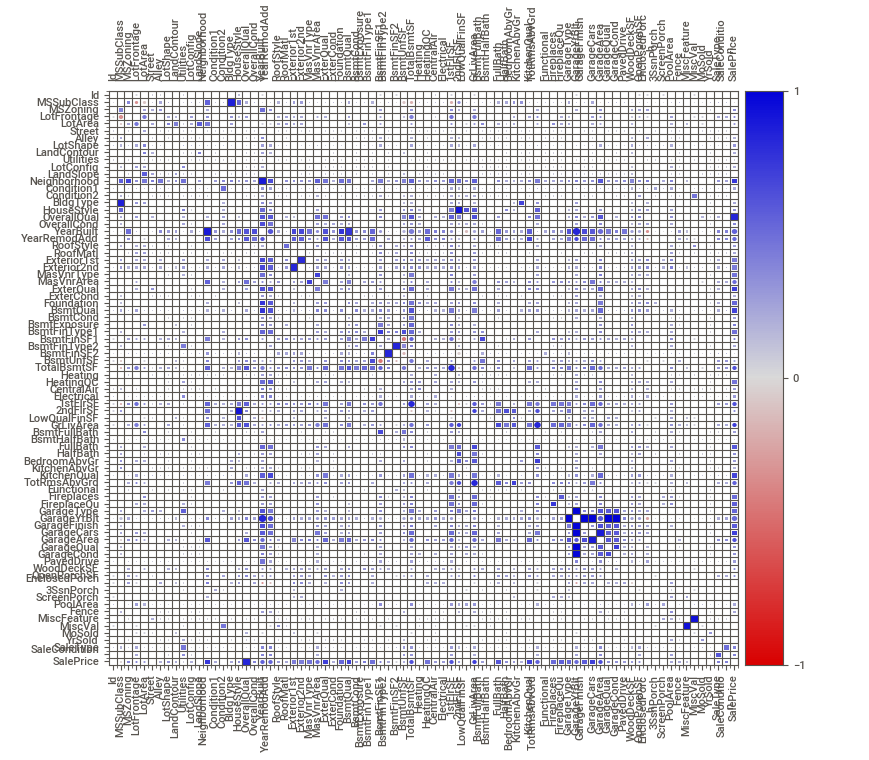
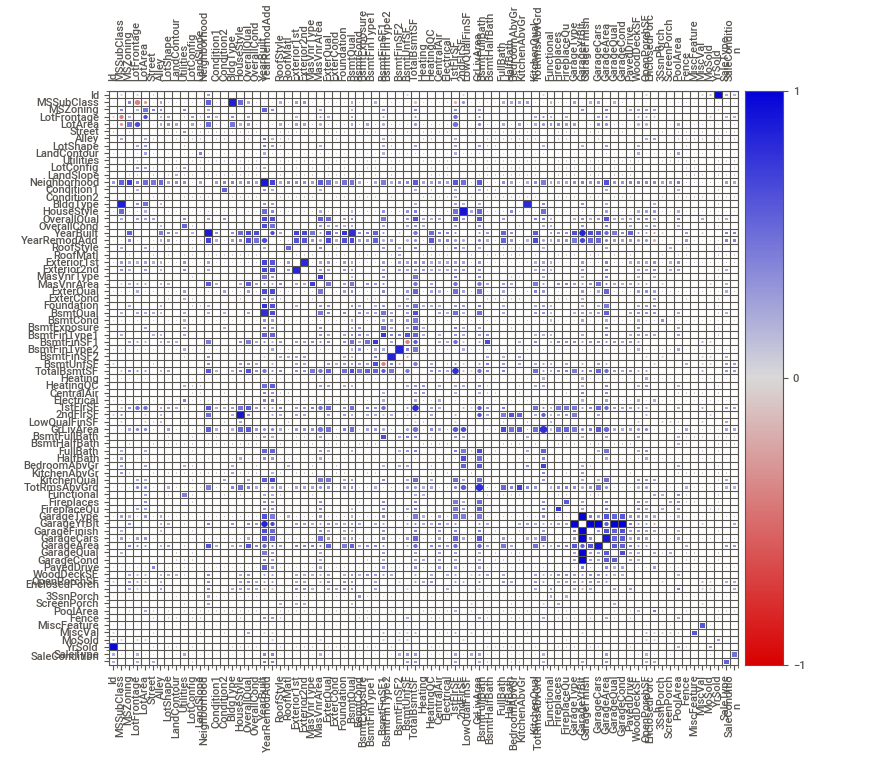

In [ ]:
# Train & Test Dataset 비교
my_report_train_vs_test = sv.compare(c_train, c_test)
my_report_train_vs_test.show_notebook()

In [ ]:
c_train['train']  = 1
c_test['train']  = 0
df = pd.concat([c_train, c_test], axis=0,sort=False) #concat으로 sorting없이 r binding하는 중 (merge보다 concat이 쌉편함)

**Calculating the percentage of missing values of each feature (결측치 핸들링)**

In [ ]:
#Percentage of NAN Values 
NAN = [(c, df[c].isna().mean()*100) for c in df] # series가 나오는게 아니라, 컬럼명이 나옴
NAN = pd.DataFrame(NAN, columns=["column_name", "percentage"])

**Features with more than 50% of missing values.(NaN이 50% 이상인 변수를 뽑아내는 방법)**

In [ ]:
NAN = NAN[NAN.percentage > 50] 
NAN.sort_values("percentage", ascending=False)

## 총 4개의 변수 컬럼이 결측치가 50% 넘게 있음을 포착

,column_name,percentage
72,PoolQC,99.657417
74,MiscFeature,96.402878
6,Alley,93.216855
73,Fence,80.438506


We can drop PoolQC, MiscFeature, Alley and Fence features because they have more than 80% of missing values.

In [ ]:
#Drop PoolQC, MiscFeature, Alley and Fence features ==> 쓸데없는 컬럼 빼버리기
df = df.drop(['Alley','PoolQC','Fence','MiscFeature'],axis=1) # => axis=0이면 row를 날리는거라 column을 날릴려면 꼭 1을 쓰기

Now we will select numerical and categorical features (수치형, 범주형 데이터 분리하여 관리)

In [ ]:
object_columns_df = df.select_dtypes(include=['object']) 
# python에서는 범주형 데이터에 대해 dtype을 object를 씀
numerical_columns_df =df.select_dtypes(exclude=['object'])

In [ ]:
object_columns_df.dtypes[:5] #범주형 변수 dtype check

MSZoning       object
Street         object
LotShape       object
LandContour    object
Utilities      object
dtype: object

In [ ]:
numerical_columns_df.dtypes[:5] #수치형 변수 dtype check

Id               int64
MSSubClass       int64
LotFrontage    float64
LotArea          int64
OverallQual      int64
dtype: object

Dealing with **categorical** feature (범주형 데이터 전처리부터 진행)

In [ ]:
#Number of null values in each feature
null_counts = object_columns_df.isnull().sum()
print("Number of null values in each column:\n{}".format(null_counts))

Number of null values in each column:
MSZoning            4
Street              0
LotShape            0
LandContour         0
Utilities           2
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
RoofStyle           0
RoofMatl            0
Exterior1st         1
Exterior2nd         1
MasVnrType         24
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           81
BsmtCond           82
BsmtExposure       82
BsmtFinType1       79
BsmtFinType2       80
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
KitchenQual         1
Functional          2
FireplaceQu      1420
GarageType        157
GarageFinish      159
GarageQual        159
GarageCond        159
PavedDrive          0
SaleType            1
SaleCondition       0
dtype: int64


We will fill -- BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, GarageType, GarageFinish, GarageQual, FireplaceQu, GarageCond -- **with "None"** (Take a look in the data description).
We will fill the rest of features with th most frequent value (using its own most frequent value).


In [ ]:
columns_None = [
    'BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',
    'GarageType','GarageFinish','GarageQual','FireplaceQu','GarageCond'
]
object_columns_df[columns_None]= object_columns_df[columns_None].fillna('None')

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [ ]:
columns_with_lowNA = [
    'MSZoning','Utilities','Exterior1st','Exterior2nd',
    'MasVnrType','Electrical','KitchenQual','Functional','SaleType'
]
#fill missing values for each column (using its own most frequent value)
object_columns_df[columns_with_lowNA] = object_columns_df[columns_with_lowNA].fillna(object_columns_df.mode().iloc[0]) 
## NaN의 비율이 작은 컬럼에 대해서는 mode로 결측치를 대체한다

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3069: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


**Now we have a "clean(=without NaN) categorical features**

In the next step we will deal with the **numerical** features black

범주형 다음 Numerical Data 전처리 하기

In [ ]:
#Number of null values in each feature : 일단 카운팅
null_counts = numerical_columns_df.isnull().sum()
print("Number of null values in each column:\n{}".format(null_counts))

Number of null values in each column:
Id                  0
MSSubClass          0
LotFrontage       486
LotArea             0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
MasVnrArea         23
BsmtFinSF1          1
BsmtFinSF2          1
BsmtUnfSF           1
TotalBsmtSF         1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBath        2
BsmtHalfBath        2
FullBath            0
HalfBath            0
BedroomAbvGr        0
KitchenAbvGr        0
TotRmsAbvGrd        0
Fireplaces          0
GarageYrBlt       159
GarageCars          1
GarageArea          1
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
MiscVal             0
MoSold              0
YrSold              0
SalePrice        1459
train               0
dtype: int64


**Fill GarageYrBlt and LotFrontage**
**Fill the rest of columns with 0**

In [ ]:
print((numerical_columns_df['YrSold']-numerical_columns_df['YearBuilt']).median())
print(numerical_columns_df["LotFrontage"].median())

35.0
68.0


**So we will fill the year with 1979 and the Lot frontage with 68**

In [ ]:
numerical_columns_df['GarageYrBlt'] = numerical_columns_df['GarageYrBlt'].fillna(numerical_columns_df['YrSold']-35)
numerical_columns_df['LotFrontage'] = numerical_columns_df['LotFrontage'].fillna(68)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
# Inplace 활용해보기
numerical_columns_df['GarageYrBlt'].fillna(
    numerical_columns_df['YrSold']-35,
    inplace=True
)
numerical_columns_df['LotFrontage'].fillna(
    68, 
    inplace=True
)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


Fill the rest of columns with 0

In [ ]:
# 위 2가지 케이스가 아닌 변수들은 다 0으로 채워줍시다
numerical_columns_df.fillna(0, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4327: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


We finally end up with a clean dataset

### Object Data 분석

                                             |          | [  0%]   00:00 -> (? left)


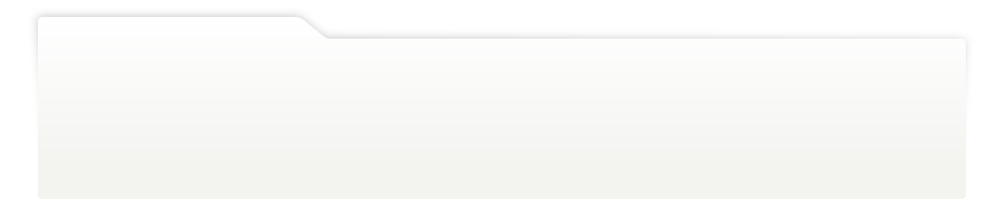
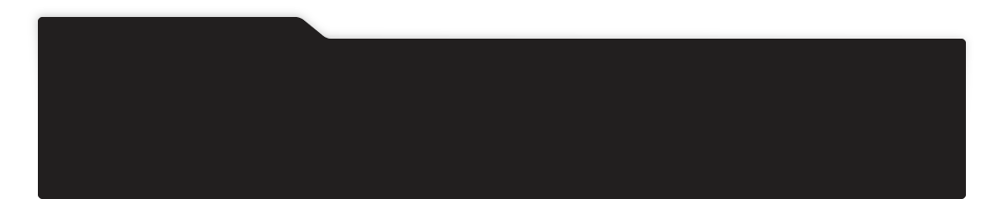
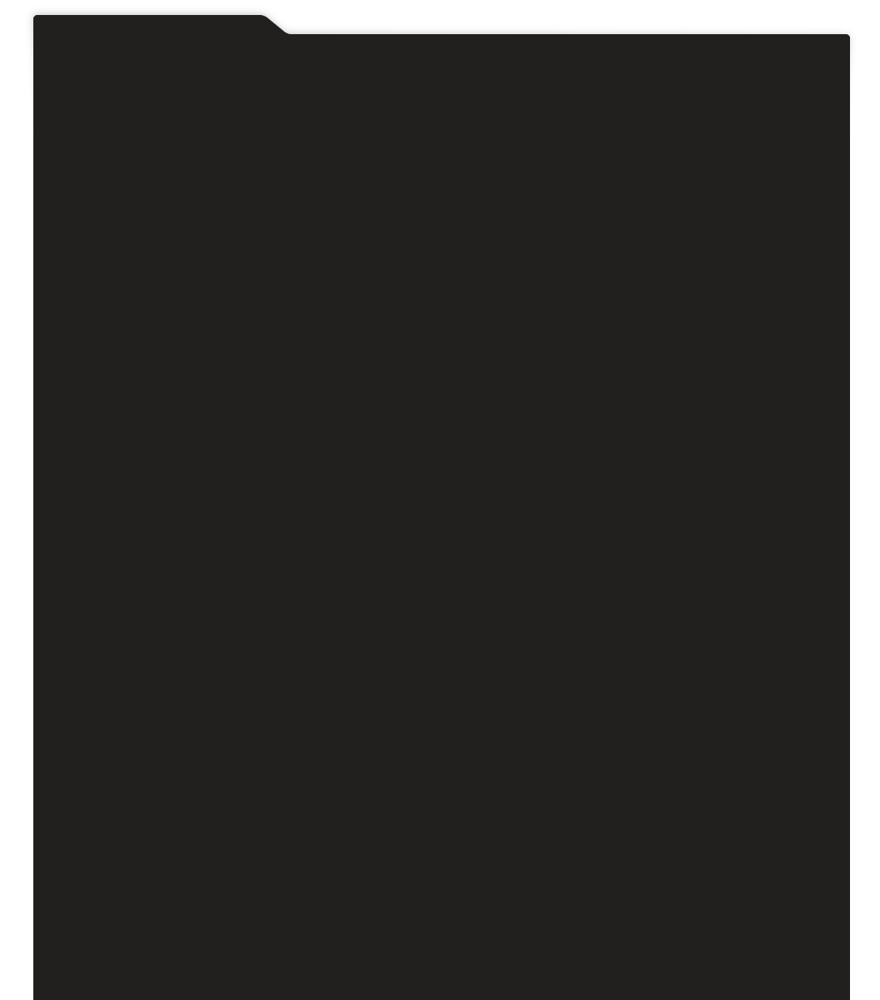
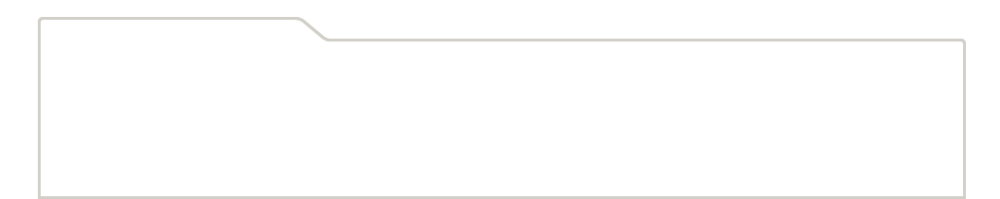
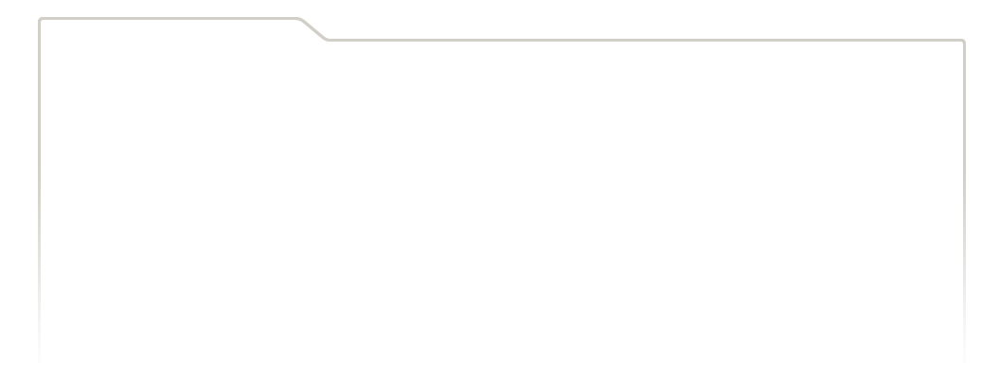
...
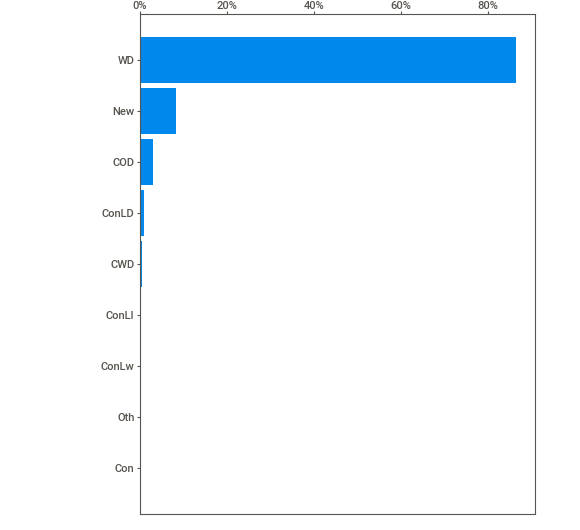
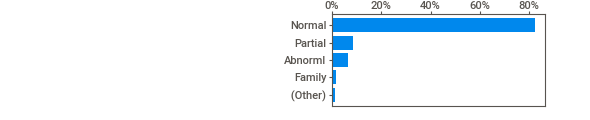
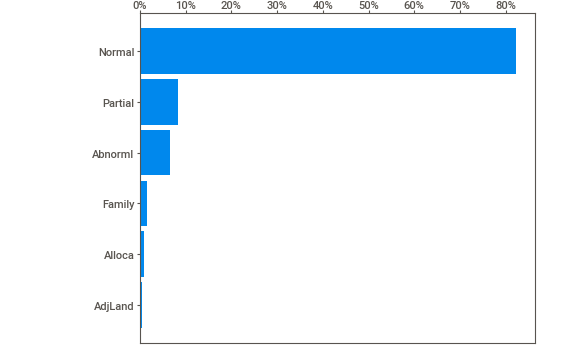
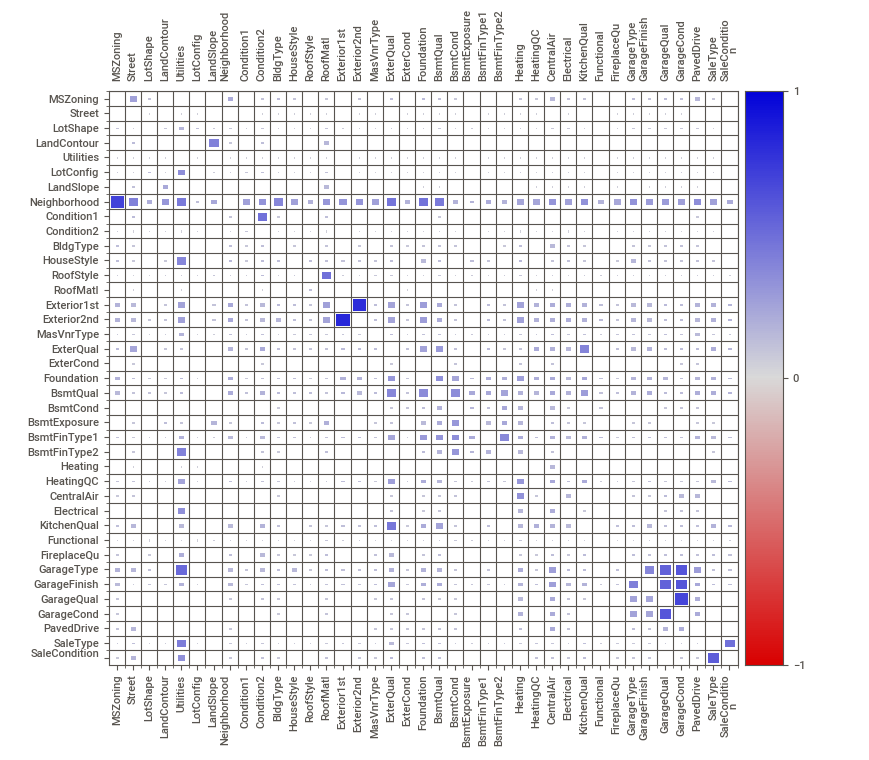
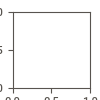

In [ ]:
# Object Dataset 분석 : 범주형부터 또 따로 sweetviz로 시각화
my_report_object = sv.analyze(object_columns_df)
my_report_object.show_notebook()

Value가 거의 Unique하다 싶은 분포는 제거 
=> 확률 변수의 sample space 중 하나의 샘플이 전체 분포의 90% 가까이 차지할 때

('Heating','RoofMatl','Condition2','Street','Utilities')

In [ ]:
object_columns_df = object_columns_df.drop(['Heating','RoofMatl','Condition2','Street','Utilities'],axis=1)

### Numerical Data 분석

                                             |          | [  0%]   00:00 -> (? left)


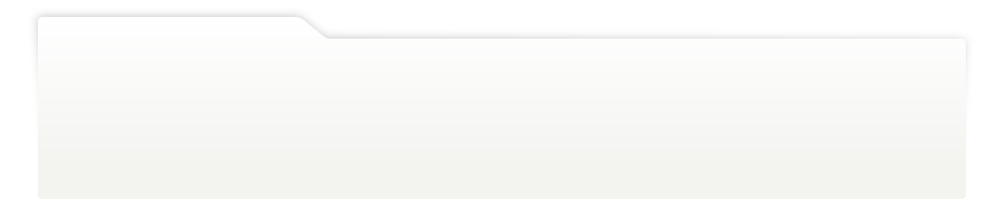
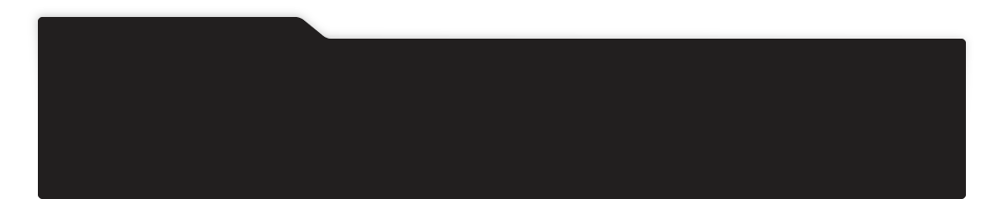
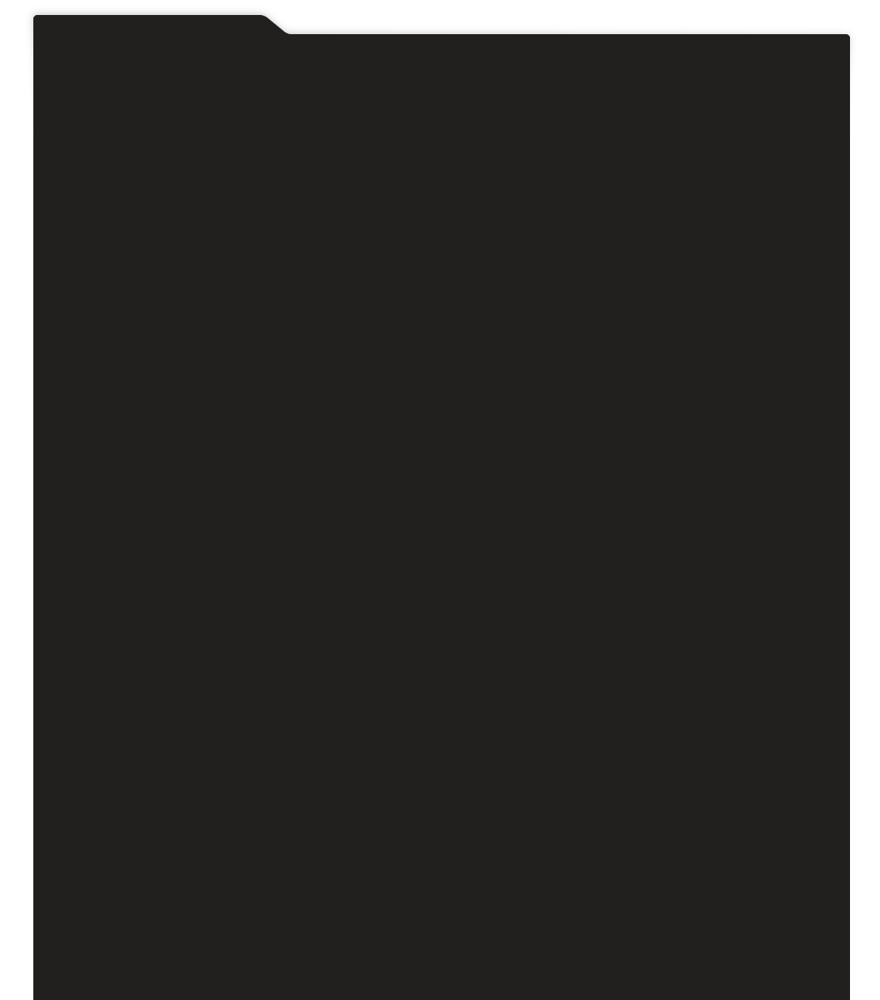
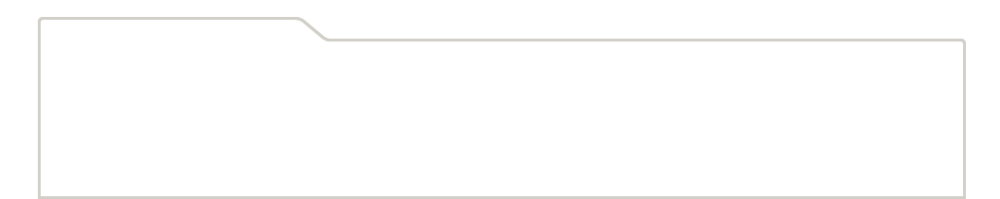
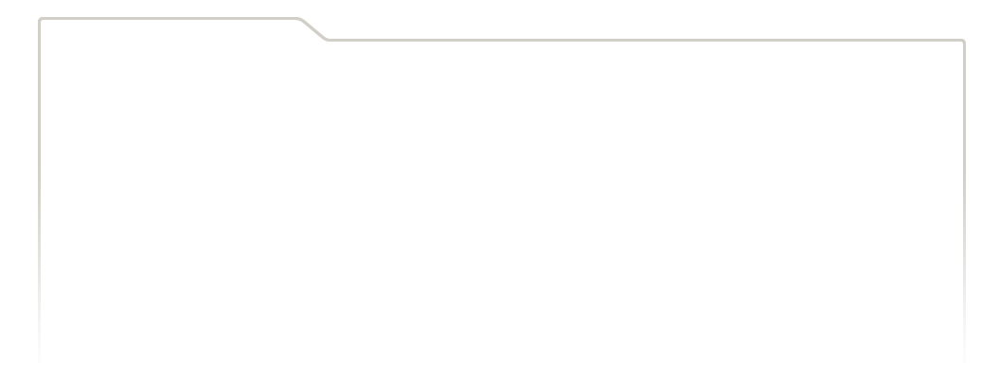
...
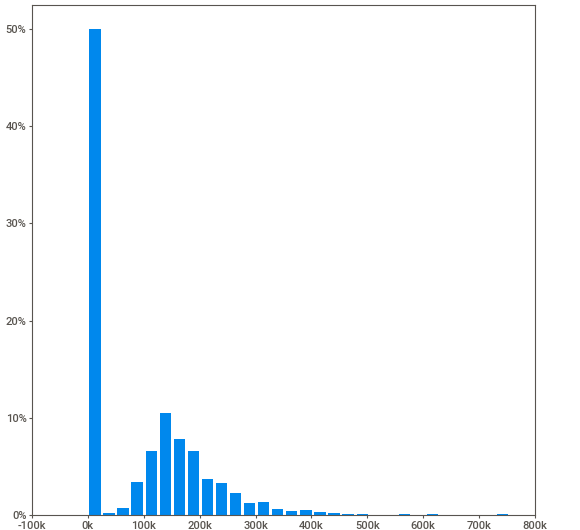
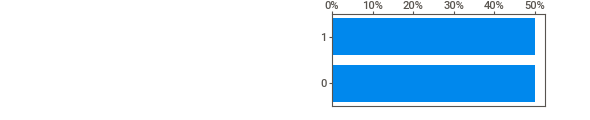
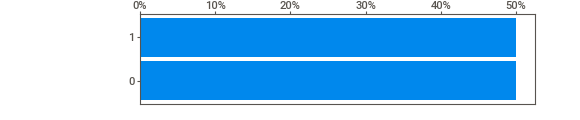
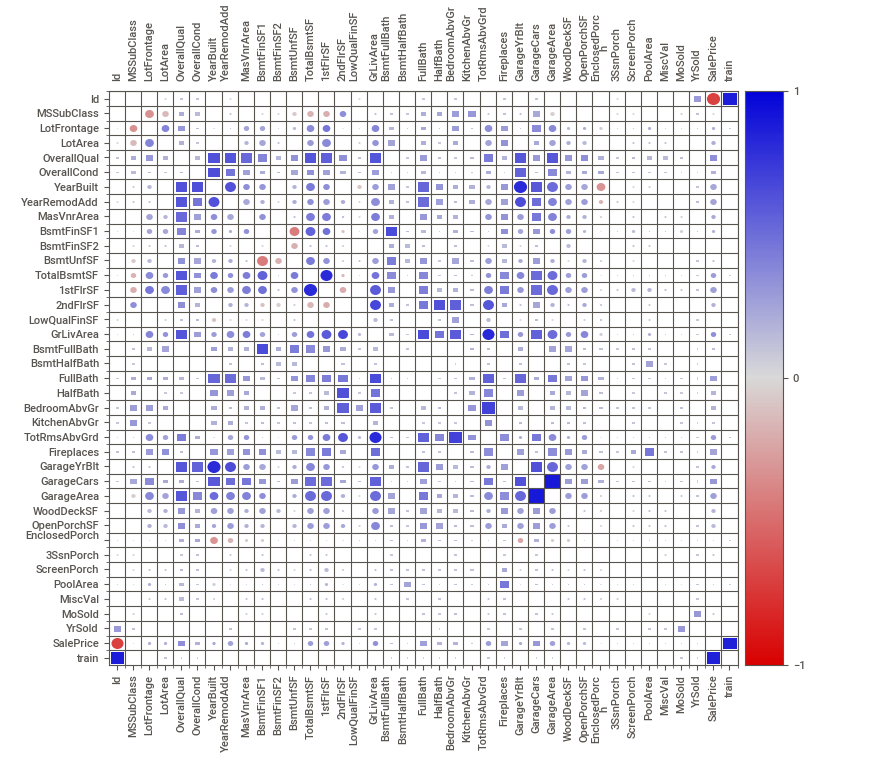
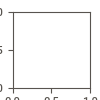

In [ ]:
# Numerical Dataset 분석
my_report_numerical = sv.analyze(numerical_columns_df)
my_report_numerical.show_notebook()

눈에 띄는 Outlier는 없어보인다.

In [ ]:
# 변수별 수치형 아웃라이어를 다루는 계산법
import numpy
# random numbers => outlier가 있는지 없는지 확인해보자
arr = [10, 386, 479, 627, 20, 523, 482, 483, 542, 699, 535, 617, 577, 471, 615, 583, 441, 562, 563, 527, 453, 530, 433, 541, 585, 704, 443, 569, 430, 637, 331, 511, 552, 496, 484, 566, 554, 472, 335, 440, 579, 341, 545, 615, 548, 604, 439, 556, 442, 461, 624, 611, 444, 578, 405, 487, 490, 496, 398, 512, 422, 455, 449, 432, 607, 679, 434, 597, 639, 565, 415, 486, 668, 414, 665, 763, 557, 304, 404, 454, 689, 610, 483, 441, 657, 590, 492, 476, 437, 483, 529, 363, 711, 543]
print( 'length of arr = %d' % len(arr)) # array 데이터 개수 파악
elements = numpy.array(arr)

# 평균과 표준편차를 numpy 기반으로 계산
mean = numpy.mean(elements, axis=0) #행 기준 계산
std = numpy.std(elements, axis=0) # 마찬가지로 행 기준 계산(j번째 열 데이터 평균을 구하려면, j번째 열의 1번째~i번째 행까지 다 평균쳐야지)

# for를 돌리면서 특정 기준에 맞지 않는 친구들을 날린다
final_list_remove = [
    x
    for x in arr 
    if (x > mean - 3 * std) 
    # lower extreme 보다 값이 큰지 체크하고, 해당 범위에 있으면 살아 남는다
]
final_list_remove = [
    x 
    for x in final_list_remove
    if (x < mean + 3 * std)
    # upper extreme 보다 값이 작은지 체크하고 해당 범위에 있으면 살아 남는다
]

print()
print(final_list_remove)
print( 'length of final_list_move = %d' % len(final_list_remove))

final_list = [
    x if (x > mean - 3 * std) else (mean - 3 * std)
    for x in arr 
]
final_list = [
    x if (x < mean + 3 * std) else (mean + 3 * std)
    for x in final_list
]

print()
print(final_list)
print( 'length of final_list = %d' % len(final_list))

# 위 구조에서는 outlier = mean-3*std or mean+3*std로 매칭되기에,
## 최종적으로 아웃라이어의 대체값이 float 타입으로 되는데,  
### 학습 과정에서의 엄밀성/효율성을 감안한다면, float dtype을 int로 바꿔주자

length of arr = 94

[386, 479, 627, 523, 482, 483, 542, 699, 535, 617, 577, 471, 615, 583, 441, 562, 563, 527, 453, 530, 433, 541, 585, 704, 443, 569, 430, 637, 331, 511, 552, 496, 484, 566, 554, 472, 335, 440, 579, 341, 545, 615, 548, 604, 439, 556, 442, 461, 624, 611, 444, 578, 405, 487, 490, 496, 398, 512, 422, 455, 449, 432, 607, 679, 434, 597, 639, 565, 415, 486, 668, 414, 665, 763, 557, 304, 404, 454, 689, 610, 483, 441, 657, 590, 492, 476, 437, 483, 529, 363, 711, 543]
length of final_list_move = 92

[153.97618208815595, 386, 479, 627, 153.97618208815595, 523, 482, 483, 542, 699, 535, 617, 577, 471, 615, 583, 441, 562, 563, 527, 453, 530, 433, 541, 585, 704, 443, 569, 430, 637, 331, 511, 552, 496, 484, 566, 554, 472, 335, 440, 579, 341, 545, 615, 548, 604, 439, 556, 442, 461, 624, 611, 444, 578, 405, 487, 490, 496, 398, 512, 422, 455, 449, 432, 607, 679, 434, 597, 639, 565, 415, 486, 668, 414, 665, 763, 557, 304, 404, 454, 689, 610, 483, 441, 657, 590, 492, 476, 437, 483, 529, 3

In [ ]:
# outlier 값을 int로 형변환하는 단순 코딩 (else문)

final_list = [
    x if (x > mean - 3 * std) else int(mean - 3 * std)
    # x가 lower extreme 내에 있다면 final_list에 추가, 
    ## 아니라면 lower extreme 값 자체로 대체 
    for x in arr 
]
final_list = [
    x if (x < mean + 3 * std) else int(mean + 3 * std)
    for x in final_list
    # x가 upper extreme 내에 있다면 final_list에 추가, 
    ## 아니라면 upper extreme 값 자체로 대체 
]

# 먼저 쓰인 print랑 비교했을때, outlier 값들은 전부 int로 표시되는 것을 알 수 있음
print()
print(final_list)
print( 'length of final_list = %d' % len(final_list))


[153, 386, 479, 627, 153, 523, 482, 483, 542, 699, 535, 617, 577, 471, 615, 583, 441, 562, 563, 527, 453, 530, 433, 541, 585, 704, 443, 569, 430, 637, 331, 511, 552, 496, 484, 566, 554, 472, 335, 440, 579, 341, 545, 615, 548, 604, 439, 556, 442, 461, 624, 611, 444, 578, 405, 487, 490, 496, 398, 512, 422, 455, 449, 432, 607, 679, 434, 597, 639, 565, 415, 486, 668, 414, 665, 763, 557, 304, 404, 454, 689, 610, 483, 441, 657, 590, 492, 476, 437, 483, 529, 363, 711, 543]
length of final_list = 94




# 1번째 연습 : 수치형 변수들의 3 표준편차 범위 밖 Outlier 갯수 구해보기

* [5-10분 소요]
* DM으로 갯수 맞추는 사람 1-3등
* 평일 점심 여의도에서 강사와 식사 기회 제공

### 연습문제 : 수치형 변수들의 3표준편차 범위 밖 Outlier 개수 구해보기 (일단 컬럼 하나에서만) => 전체 컬럼 전부로 확장

In [ ]:
# 일단 컬럼 하나에서 구하기 
## 컬럼 하나에서 놀아보기
import numpy
import pandas as pd
# numerics in dataset => 총 개수부터 확인하려면 간단히 print(len())하면 되고
YearBuilt = numerical_columns_df[["YearBuilt"]]

mean = YearBuilt.mean()
std = YearBuilt.std()

lower_bound = mean-3*std
int(lower_bound) #1880년이 Lower bound

In [ ]:
numerical_columns_df.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,train
0,1,60,65.0,8450,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856,854,0,1710,1.0,0.0,2,1,3,1,8,0,2003.0,2.0,548.0,0,61,0,0,0,0,0,2,2008,208500.0,1
1,2,20,80.0,9600,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262,0,0,1262,0.0,1.0,2,0,3,1,6,1,1976.0,2.0,460.0,298,0,0,0,0,0,0,5,2007,181500.0,1
2,3,60,68.0,11250,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920,866,0,1786,1.0,0.0,2,1,3,1,6,1,2001.0,2.0,608.0,0,42,0,0,0,0,0,9,2008,223500.0,1
3,4,70,60.0,9550,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961,756,0,1717,1.0,0.0,1,0,3,1,7,1,1998.0,3.0,642.0,0,35,272,0,0,0,0,2,2006,140000.0,1
4,5,60,84.0,14260,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145,1053,0,2198,1.0,0.0,2,1,4,1,9,1,2000.0,3.0,836.0,192,84,0,0,0,0,0,12,2008,250000.0,1


In [ ]:
# 앞서 변수, 배열 정의 등 준비 구조를 마쳤으니께, 실제 numerical_data_df에서 개별 변수 안에 존재하는 outlier data를 정의하고 찾아내자 (총 44의 결과?)
## outlier = mean +_3std 범위 밖의 것들 (개별 변수가 정규분포를 따르는지 확인한다면 더 굳 => sweetviz로 쉽게 확인 가능)

### 1) upper_outliers (TBD)

₩Now we will create some new features

In [ ]:
### lower_outliers
for x in elements2:
    print(x < mean-3*std)

In [ ]:
# 집이 지어진 년도부터 팔린 그 시점까지 집이 몇년된 집인지 파악 (그냥 간단한 파생변수 정의)

numerical_columns_df['Age_House']= (numerical_columns_df['YrSold']-numerical_columns_df['YearBuilt'])
numerical_columns_df['Age_House'].describe()

# 집 나이가 음수면 이건 백프로 아웃라이어

min = -1????

In [ ]:
# 집 나이가 음수인 데이터 파악
Negatif = numerical_columns_df[numerical_columns_df['Age_House'] < 0]
Negatif

Like we see here that the minimun is -1 ???

It is strange to find that the house was sold in 2007 before the YearRemodAdd 2009.

So we decide to change the year of sold to 2009

In [ ]:
# 위 아웃라이어 데이터에 대해 replace 해주는 과정 => 2007이었던걸 2009로 바꿔준다 (팔린 시점 >= 만들어진 시점이어야 하니까..)
numerical_columns_df.loc[numerical_columns_df['YrSold'] < numerical_columns_df['YearBuilt'],'YrSold' ] = 2009

# Age_House라는 파생변수 생성 (팔린 시점 기준 집의 나이)
numerical_columns_df['Age_House']= (numerical_columns_df['YrSold']-numerical_columns_df['YearBuilt'])
numerical_columns_df['Age_House'].describe()

* TotalBsmtBath : Sum of : BsmtFullBath and 1/2 BsmtHalfBath

* TotalBath : Sum of : FullBath and 1/2 HalfBath

* TotalSA : Sum of : 1stFlrSF and 2ndFlrSF and basement area

In [ ]:
numerical_columns_df['TotalBsmtBath'] = numerical_columns_df['BsmtFullBath'] + numerical_columns_df['BsmtFullBath']*0.5
numerical_columns_df['TotalBath'] = numerical_columns_df['FullBath'] + numerical_columns_df['HalfBath']*0.5 
numerical_columns_df['TotalSA']=numerical_columns_df['TotalBsmtSF'] + numerical_columns_df['1stFlrSF'] + numerical_columns_df['2ndFlrSF']

Now the next step is to encode categorical features (레이블 인코더)

1. Ordinal categories features - Mapping from 0 to N

In [ ]:
bin_map  = {'TA':2,'Gd':3, 'Fa':1,'Ex':4,'Po':1,'None':0,'Y':1,'N':0,'Reg':3,'IR1':2,'IR2':1,'IR3':0,"None" : 0,
            "No" : 2, "Mn" : 2, "Av": 3,"Gd" : 4,"Unf" : 1, "LwQ": 2, "Rec" : 3,"BLQ" : 4, "ALQ" : 5, "GLQ" : 6
            }
object_columns_df['ExterQual'] = object_columns_df['ExterQual'].map(bin_map)
object_columns_df['ExterCond'] = object_columns_df['ExterCond'].map(bin_map)
object_columns_df['BsmtCond'] = object_columns_df['BsmtCond'].map(bin_map)
object_columns_df['BsmtQual'] = object_columns_df['BsmtQual'].map(bin_map)
object_columns_df['HeatingQC'] = object_columns_df['HeatingQC'].map(bin_map)
object_columns_df['KitchenQual'] = object_columns_df['KitchenQual'].map(bin_map)
object_columns_df['FireplaceQu'] = object_columns_df['FireplaceQu'].map(bin_map)
object_columns_df['GarageQual'] = object_columns_df['GarageQual'].map(bin_map)
object_columns_df['GarageCond'] = object_columns_df['GarageCond'].map(bin_map)
object_columns_df['CentralAir'] = object_columns_df['CentralAir'].map(bin_map)
object_columns_df['LotShape'] = object_columns_df['LotShape'].map(bin_map)
object_columns_df['BsmtExposure'] = object_columns_df['BsmtExposure'].map(bin_map)
object_columns_df['BsmtFinType1'] = object_columns_df['BsmtFinType1'].map(bin_map)
object_columns_df['BsmtFinType2'] = object_columns_df['BsmtFinType2'].map(bin_map)

PavedDrive =   {"N" : 0, "P" : 1, "Y" : 2}
object_columns_df['PavedDrive'] = object_columns_df['PavedDrive'].map(PavedDrive)

Will we use One hot encoder to encode the rest of categorical features

In [ ]:
#Select categorical features
rest_object_columns = object_columns_df.select_dtypes(include=['object'])
#Using One hot encoder (get_dummies 사용)
object_columns_df = pd.get_dummies(object_columns_df, columns=rest_object_columns.columns) 

# 2번째 연습 : Scikit Learn의 label encoder / label binarizer 적용해보기

* [5-10분 소요]
* 범주형 변수별 Unique 갯수 동일한지 비교해보기

참고 링크 
- https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html
- https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelBinarizer.html

In [ ]:
arr_LandSlope = np.array(object_columns_df["LandSlope"])
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(arr_LandSlope)
le.classes_

transformed = le.transform(arr_LandSlope) # 범주형 변수를 transform
le.inverse_transform(transformed) # transfor된 것을 다시 변수형으로


transformed_df = pd.DataFrame(transformed)
#binarizer로도 해보기

## 여기서 범주형 변수(컬럼) 하나만 인코딩을 해놨기 때문에, full-encoded된 데이터셋이 아니기에 사이킷런 라소 모델에 돌리면 
## 변수 1개 빼고는 전부다 그냥 범주형 변수가 되어버림 => 모델을 돌리려면 LandSlope 변수 하나에 대해서만 돌려야함

## Concat Categorical ("after encoding") and numerical features

In [ ]:
# 이제 나눠놓은 범주형(인코딩 완료된), 수치형 concat하자 !
df_final = pd.concat([object_columns_df, numerical_columns_df], axis=1,sort=False) #컬럼끼리 분리된 부분이기 때문에 c-bind로 간다

df_final.head()

,MSZoning,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,train
0,RL,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,Ex,Y,SBrkr,Gd,Typ,None,Attchd,RFn,TA,TA,Y,WD,Normal,1,60,65.0,8450,7,5,2003,2003,196.0,706.0,0.0,150.0,856.0,856,854,0,1710,1.0,0.0,2,1,3,1,8,0,2003.0,2.0,548.0,0,61,0,0,0,0,0,2,2008,208500.0,1
1,RL,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,1Story,Gable,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,2,20,80.0,9600,6,8,1976,1976,0.0,978.0,0.0,284.0,1262.0,1262,0,0,1262,0.0,1.0,2,0,3,1,6,1,1976.0,2.0,460.0,298,0,0,0,0,0,0,5,2007,181500.0,1
2,RL,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,3,60,68.0,11250,7,5,2001,2002,162.0,486.0,0.0,434.0,920.0,920,866,0,1786,1.0,0.0,2,1,3,1,6,1,2001.0,2.0,608.0,0,42,0,0,0,0,0,9,2008,223500.0,1
3,RL,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,Gable,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml,4,70,60.0,9550,7,5,1915,1970,0.0,216.0,0.0,540.0,756.0,961,756,0,1717,1.0,0.0,1,0,3,1,7,1,1998.0,3.0,642.0,0,35,272,0,0,0,0,2,2006,140000.0,1
4,RL,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal,5,60,84.0,14260,8,5,2000,2000,350.0,655.0,0.0,490.0,1145.0,1145,1053,0,2198,1.0,0.0,2,1,4,1,9,1,2000.0,3.0,836.0,192,84,0,0,0,0,0,12,2008,250000.0,1


In [ ]:
# 최종적으로, 학습변수로 활용하지 않는 변수들을 또 날려보자 
# df_final = df_final.drop(['Id'],axis=1) ==> index는 날려주고 (컬럼 기준 싹 drop) (원래 날리는건데 이미 날려져있음 왜지 ㅋㅋㅋ)

# train에서 날릴 것
df_train = df_final[df_final['train'] == 1]
df_train = df_train.drop(['train'],axis=1)

# test에서 날릴 것
df_test = df_final[df_final['train'] == 0]
df_test = df_test.drop(['SalePrice'],axis=1) #Target 변수 
df_test = df_test.drop(['train'],axis=1)

## Separate Train and Targets

In [ ]:
target= df_train['SalePrice']

df_train = df_train.drop(['SalePrice'],axis=1) #sale price가 아닌 변수들은 전부다 학습 데이터로 넣기

In [ ]:
df_train.shape, target.shape

((1460, 71), (1460,))

### 위까지하면 변수 전처리는 끝났다 !

# Feature Selection
* Target에 대한 1차원, 2차원 분석 자체는 시간이 너무 오래걸린다..
* Lasso / Ridge 활용

In [ ]:
# Lasso Regression
# 위에서 범주형 인코딩한것 landslope 하나만 가지고 모델 돌려보자

from sklearn import linear_model #선형회귀 모델 호출
clf_lasso = linear_model.Lasso(alpha=0.1) #Lasso에서 다중공선성을 가진 변수 중 유의미한 변수에만 alpha값을 준다 <=> 쓸데없는 변수에는 0을 준다
## 여까지 하면 lasso 회귀에 의해 쓸데없는 변수들이 다 발라져나감 => 변수 축소
clf_lasso.fit(train, target)
## 전체 변수 인코딩 잘 해서 회귀모델 돌렸다면, 개별 변수마다 계수가 다 맵핑돼서 array가 나옴

ValueError: ignored

In [ ]:
print(clf_lasso.coef_)

AttributeError: ignored

In [ ]:
print(clf_lasso.coef_==0) #라소가 날린 변수가 뭔지 필터링해서 확인하기 (출력결과는 boolean으로 나옴)

In [ ]:
print(clf_lasso.intercept_) #선형회귀분석에서의 alpha(절편) 값을 return 

In [ ]:
# Lasso Regression
from sklearn import linear_model
clf_ridge = linear_model.Ridge(alpha=0.1)
clf_ridge.fit(df_train, target)

In [ ]:
print(clf_ridge.coef_)

In [ ]:
print(clf_ridge.coef_==0)

In [ ]:
print(clf_ridge.intercept_)

# Feature Transformation (변수 변환)
### "Numerical"의 경우 진행 <=> One Hot Encoder, Label Encoder는 범주형 변수
1. Standard Scaler
2. Min-max Scaler 
(0-1 사이로 표현되어야할 때 기본적으로 사용) => 그냥 0-1 rebase 하는거임
3. Robust Scaler
4. Quantile Transformer

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, QuantileTransformer

In [ ]:
df_train.iloc[:,0:1].head()

,MSZoning
0,RL
1,RL
2,RL
3,RL
4,RL


In [ ]:
standard = StandardScaler()
standard.fit_transform(df_train.iloc[:,0:1])
# 범주형 변수들 전처리 똑바로 안돼서 계속 아래와 같은 오류나고 있음

ValueError: ignored

In [ ]:
minmax = MinMaxScaler()
minmax.fit_transform(df_train.iloc[:,0:1])

ValueError: ignored

In [ ]:
robust = RobustScaler()
robust.fit_transform(df_train.iloc[:,0:1])

In [ ]:
quantile = QuantileTransformer()
quantile.fit_transform(df_train.iloc[:,0:1])

ValueError: ignored

In [ ]:
np.unique(standard.fit_transform(df_train.iloc[:,0:1]))

In [ ]:
np.unique(minmax.fit_transform(df_train.iloc[:,0:1]))

In [ ]:
np.unique(robust.fit_transform(df_train.iloc[:,0:1]))

In [ ]:
np.unique(quantile.fit_transform(df_train.iloc[:,0:1]))

#  Feature Extraction

1. PCA / Kernel PCA (비선형 관점에서의 PCA)
2. T-SNE
3. AutoEncoder (딥러닝 기반)

In [ ]:
from sklearn.decomposition import PCA, KernelPCA
from sklearn.manifold import TSNE

In [ ]:
# PCA
## PCA에서는 n_components를 너무 적게 줄여도 안되고, 너무 많이 줄여도 안된다)
pca = PCA(n_components=10) 
pca.fit(df_train)

ValueError: ignored

In [ ]:
print(pca.explained_variance_ratio_)

In [ ]:
np.cumsum(pca.explained_variance_ratio_)

In [ ]:
# Kernel PCA

In [ ]:
kernel_pca = KernelPCA(n_components=10, kernel='poly') ## 일반 PCA와 다른 점은 선형함수 외에도 다양한 비선형적 함수 형태로 PCA를 진행할 수 있음
## 비선형함수로 차원축소를 하기 때문에 선형대수학 세계의 관점에서는 설명력을 설명할 방도가 없음
## 직관적으로 봤을때는 정교하기 때문에 Kernel PCA가 더 좋은걸 알지만, 그냥 뇌피셜이 될 가능성이 높음

kernel_pca.fit_transform(df_train)

In [ ]:
# T-SNE
tsne = TSNE(n_components=2) # T-SNE는 기본적으로 2차원으로 줄이는 것을 권장
tsne.fit_transform(df_train)

# T-SNE는 학습 시간이 오래 걸림 => 비추 ! PCA가 그냥 짱임

In [ ]:
# Autoencoder
import keras
from keras import layers

# This is the size of our encoded representations
encoding_dim = 32  # 32 floats -> compression of factor 24.5, assuming the input is 784 floats

# This is our input image
input_img = keras.Input(shape=(204,))
# "encoded" is the encoded representation of the input
encoded = layers.Dense(encoding_dim, activation='relu')(input_img)
# "decoded" is the lossy reconstruction of the input
decoded = layers.Dense(204, activation='sigmoid')(encoded)

# This model maps an input to its reconstruction
autoencoder = keras.Model(input_img, decoded)

In [ ]:
# This model maps an input to its encoded representation
encoder = keras.Model(input_img, encoded)

In [ ]:
# This is our encoded (32-dimensional) input
encoded_input = keras.Input(shape=(encoding_dim,))
# Retrieve the last layer of the autoencoder model
decoder_layer = autoencoder.layers[-1]
# Create the decoder model
decoder = keras.Model(encoded_input, decoder_layer(encoded_input))

In [ ]:
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')


In [ ]:
autoencoder.fit(df_train, df_train,
                epochs=50,
                batch_size=10,
                shuffle=True,
                validation_data=(df_train, df_train))

In [ ]:
# Encode and decode some digits
# Note that we take them from the *test* set
encoded_imgs = encoder.predict(df_train)
decoded_imgs = decoder.predict(encoded_imgs)

In [ ]:
encoded_imgs.shape

## 수업 중 과제 
    1. Train+Test Dataset에서 변수별 Outlier 갯수 체크
    2. scikit-learn 기반으로 LabelEncoder, LabelBinarizer 적용해보기

참고링크
https://www.kaggle.com/fedi1996/house-prices-data-cleaning-viz-and-modeling